# Building Your First Face Finder

 In this formative task, you will build a Python script to detect human faces in static images. This project will give you practical experience with one of the most famous algorithms in the history of the field, the Viola-Jones object detection framework, which you'll use through OpenCV's Haar Cascade classifier.

## Your objectives for this task are to:

__Implement a Face Detector:__ You will write a script in a Google Colab notebook that loads a pre-trained Haar Cascade model provided by OpenCV. Your script will read an image, detect all the faces within it, and draw bounding boxes around each one.

__Experiment with Detection Parameters:__ The core of this task is to understand that face detection isn't a "one-size-fits-all" process. You will experiment with the three key parameters of the detectMultiScale function:

__scaleFactor:__ Controls how the image is scaled to find faces of different sizes.

__minNeighbors:__ Acts as a quality filter to remove false positives.

__minSize:__ Allows you to ignore objects that are too small to be faces.

__Analyze and Document Your Results:__ You won't just be running code; you'll be conducting a scientific experiment. By systematically changing the parameters and observing the outcomes, you will document how these changes affect the detector's performance. You will record the number of faces detected, identify any false positives (faces detected where none exist), and note any missed detections (real faces the algorithm failed to find).

This task is designed to give you a deep, intuitive understanding of the trade-offs involved in computer vision. You will see firsthand how adjusting parameters can mean the difference between a fast but sloppy detector and a slow but precise one. By the end, you will have not only built a working face finder but also gained critical insight into the art and science of tuning algorithms for real-world use.

## Step 0: Setup

Before we start, we need to download a pre-trained Haar Cascade Classifier for the rest of the task. Run the following line and you can see this file is in your files list called: `haarcascade_frontalface_default.xml`


In [ ]:
#!wget https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml


zsh:1: command not found: wget


You also need a test image, you can use any of your own image containing one or more faces or the image sample we shared in the module website for this tasks.



## Step 1: Import Libraries

We need three libraries for this task: cv2 for the core computer vision functions, numpy as it's the underlying data structure for images in OpenCV, and matplotlib.pyplot for displaying our results within the Colab notebook.

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


## Step 2: Load the Classifier and Image

First, we load the Haar Cascade classifier from the XML file we downloaded. The cv2.CascadeClassifier function parses the file and prepares the model for use. Then, we load our test image using

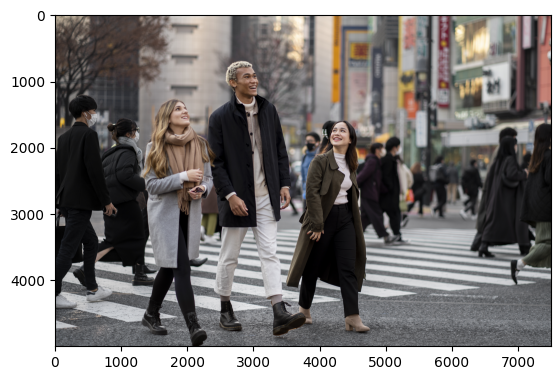

In [28]:
# Load the Haar Cascade classifier for frontal face detection
face_cascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

# Load the input image from disk
img = cv2.imread('young-friends-traveling-through-japan.jpg')
# Change to RGB format for displaying with matplotlib
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

## Step 3: Pre-processing - Convert to Grayscale

The algorithm operates on pixel intensities, not colors. Converting the image to grayscale simplifies the data and makes the detection process more efficient and faster, as there is only one channel to process instead of three.

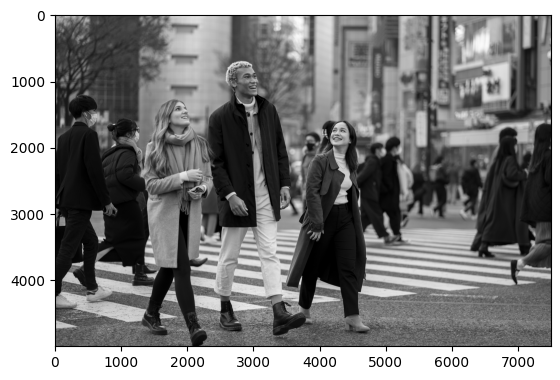

In [29]:
#Your code goes here
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
plt.imshow(img_gray, cmap='gray')


## Step 4: Run the Detection
This is the core of our application. We call the detectMultiScale method on our cascade classifier object, passing it the grayscale image. This function scans the image at multiple scales to find faces of different sizes.

In [ ]:
# Perform face detection
# The parameters are: image_source, scaleFactor, minNeighbors, minSize
# faces = face_cascade.detectMultiScale(image_source, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
# Your code goes here
faces = face_cascade.detectMultiScale(img_gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
faces.shape

(16, 4)

The faces variable is now a list of rectangles, where each rectangle is represented by four values: [x, y, w, h]. These are the coordinates of the top-left corner (x, y) and the width (w) and height (h) of the bounding box for each detected face.



## Step 5: Draw the Bounding Boxes

We now loop through the coordinates of the detected faces and draw a rectangle on our original color image to visualize the results. We use the cv2.rectangle function for this.

In [ ]:
# Copy the original image to draw the boxes on
img_with_boxes = img.copy()

# Enumerate faces to label them
for face in faces:
    x1, y1, x2, y2 = face[0], face[1], face[0] + face[2], face[1] + face[3]
    cv2.rectangle(img_with_boxes, (x1, y1), (x2, y2), (255, 0, 0), 6)  # Red box with thickness 6




## Step 6: Display the Result in Colab

We must use a library like Matplotlib to display the image. rememebr that OpenCV loads and stores images in BGR (Blue, Green, Red) channel order, while Matplotlib expects images in RGB (Red, Green, Blue) order. If we display the BGR image directly, the colors will look incorrect. We must first convert the color space.

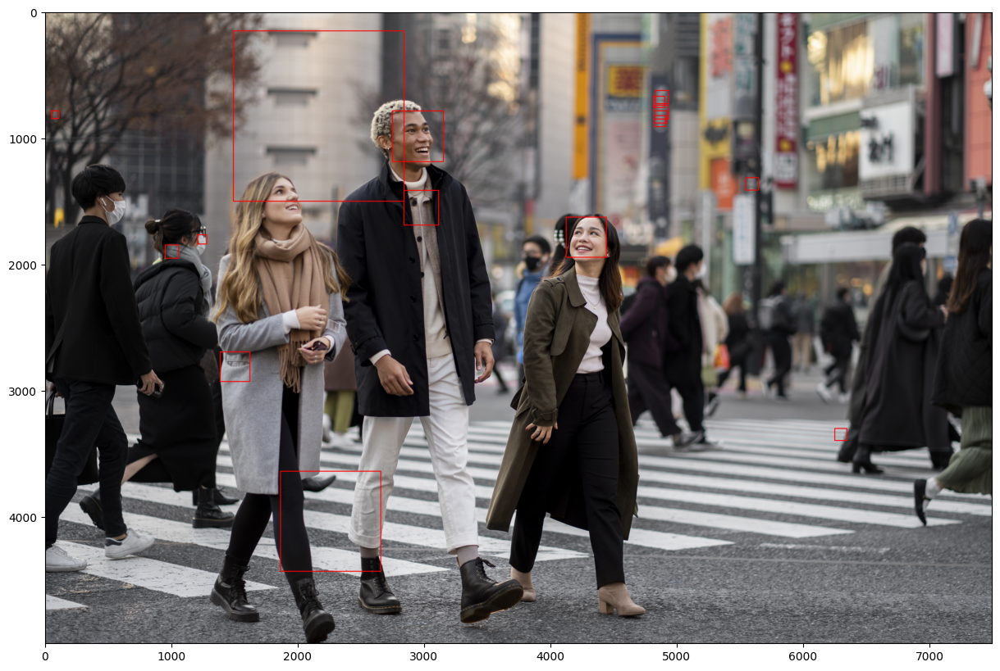

In [33]:
#Your code goes here

plt.figure(figsize=(20,10))
plt.imshow(img_with_boxes)
plt.show()

## [Optional] Step 7: An In-Depth Experiment with detectMultiScale

Now that you have a working face detector, it's time to become a computer vision scientist. The quality of your detector's output is highly dependent on the parameters you provide to the detectMultiScale function. In this section, you will experiment with these parameters to develop an intuition for how to "tune" the detector for different scenarios.

The detectMultiScale function has several parameters, but three are most critical for tuning performance: scaleFactor, minNeighbors, and minSize.

### 7.1 scaleFactor

The Haar Cascade classifier is trained on fixed-size images (e.g., 24x24 pixels). To detect faces that are larger than this in your input image, the algorithm doesn't scale the detector; instead, it scales the image. It creates an "image pyramid" by progressively shrinking the input image at each step. The scaleFactor parameter controls how much the image is resized at each step.

#### Value:

* A value greater than 1. For example, 1.1 shrinks the image by 10% for each new scale.

#### Trade-off:

* Small scaleFactor (e.g., 1.05): This creates more layers in the pyramid, meaning the detector has more chances to find a face at a size that perfectly matches its training. This is more thorough and can increase accuracy, but it is significantly slower.

* Large scaleFactor (e.g., 1.4): This creates fewer layers, making the detection process much faster. However, it might "jump" over the ideal scale for a particular face, causing it to be missed entirely.


### 7.2 minNeighbors

As the detector's sliding window moves across the image at different scales, a single face will likely be detected multiple times in slightly different, overlapping positions. The minNeighbors parameter specifies the minimum number of these neighboring rectangles that must be found for the region to be retained as a valid face detection. It acts as a confidence filter.

#### Value:
* An integer, typically in the range of 3 to 6.

#### Trade-off:

* This is your primary tool for managing the balance between false positives and missed detections.

* Low minNeighbors (e.g., 0 or 1): The detector will be very sensitive, reporting many potential faces. This will likely include numerous false positives (e.g., patterns in clothing or background textures being misidentified as faces).

* High minNeighbors (e.g., 8 or 10): The detector will be much more selective, resulting in fewer detections but with higher quality and confidence. This effectively eliminates false positives but runs the risk of discarding real faces that were detected with less certainty (perhaps due to slight rotation or poor lighting).

### 7.3 minSize

This parameter provides a straightforward way to filter out detections that are too small. It is a tuple of (width, height) in pixels. The algorithm will simply ignore any detected objects smaller than this size.

#### Value:
* A tuple, e.g., (30, 30).

#### Trade-off:
* This is mainly a trade-off between detection scope and speed. If you are only interested in large, prominent faces in an image, setting a larger minSize (e.g., (100, 100)) can significantly speed up the detection process by preventing the algorithm from wasting time searching for small objects in noisy regions of the image




original: Number of detected faces: 21


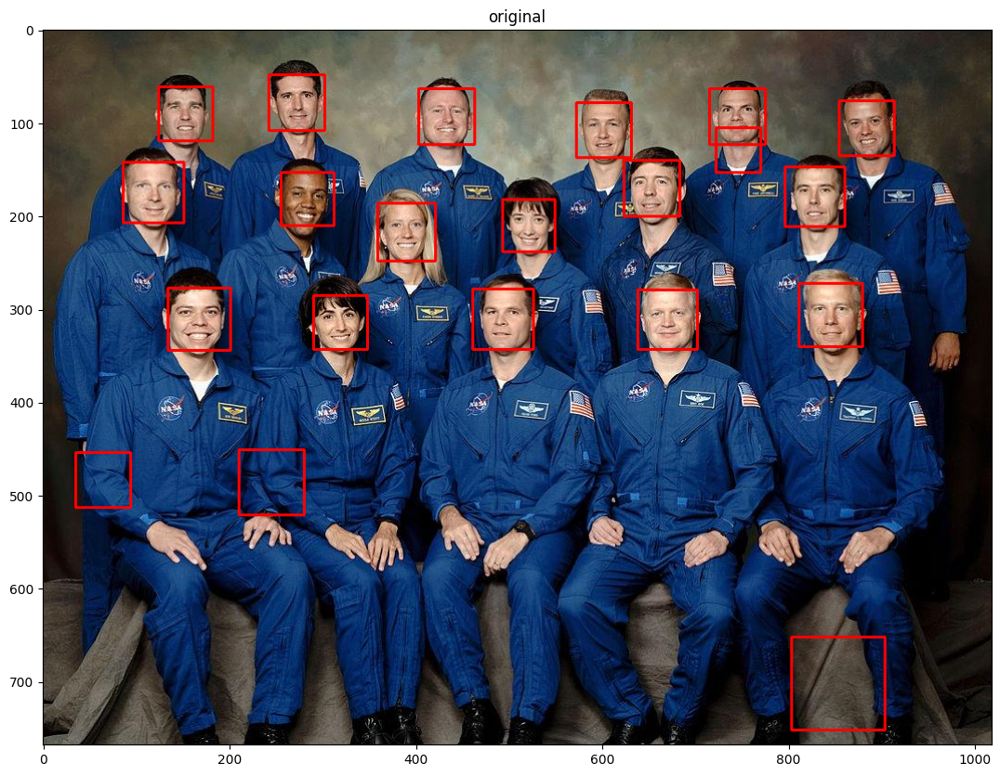

scaleFactor 1.05: Number of detected faces: 24


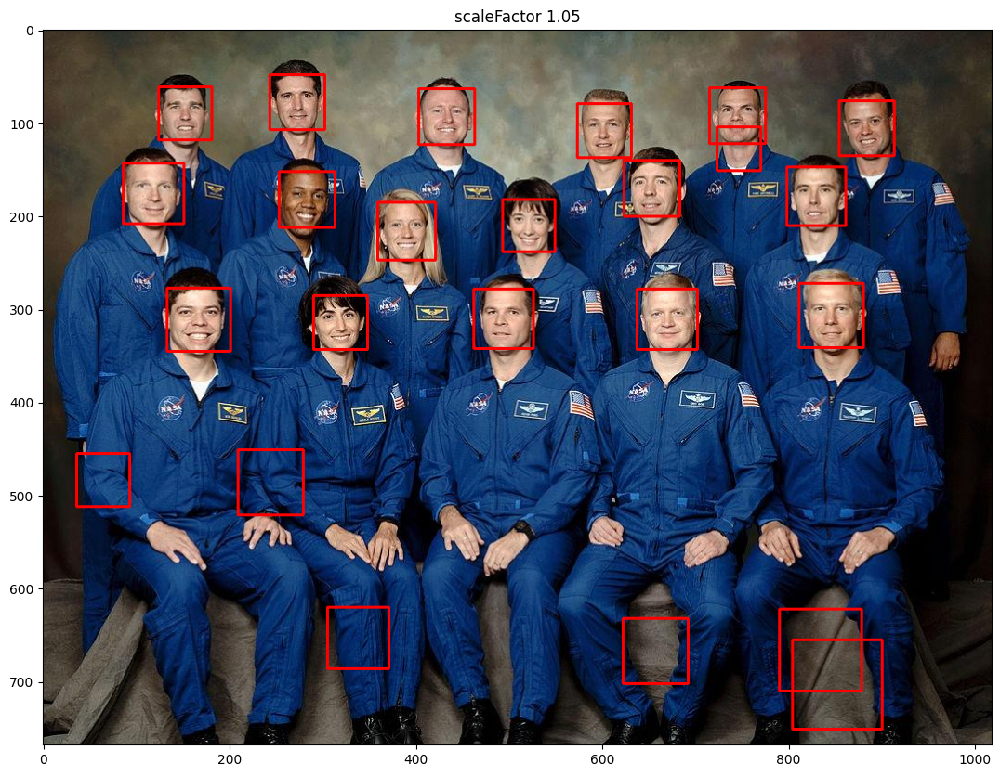

scaleFactor 1.3: Number of detected faces: 18


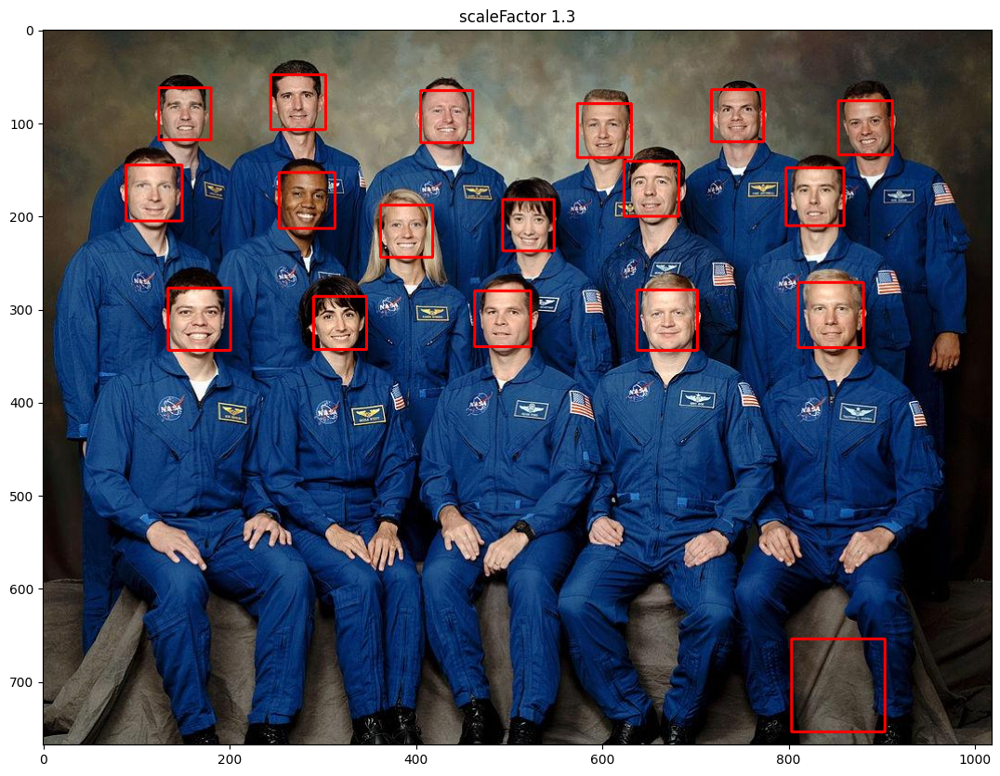

scaleFactor 1.4: Number of detected faces: 16


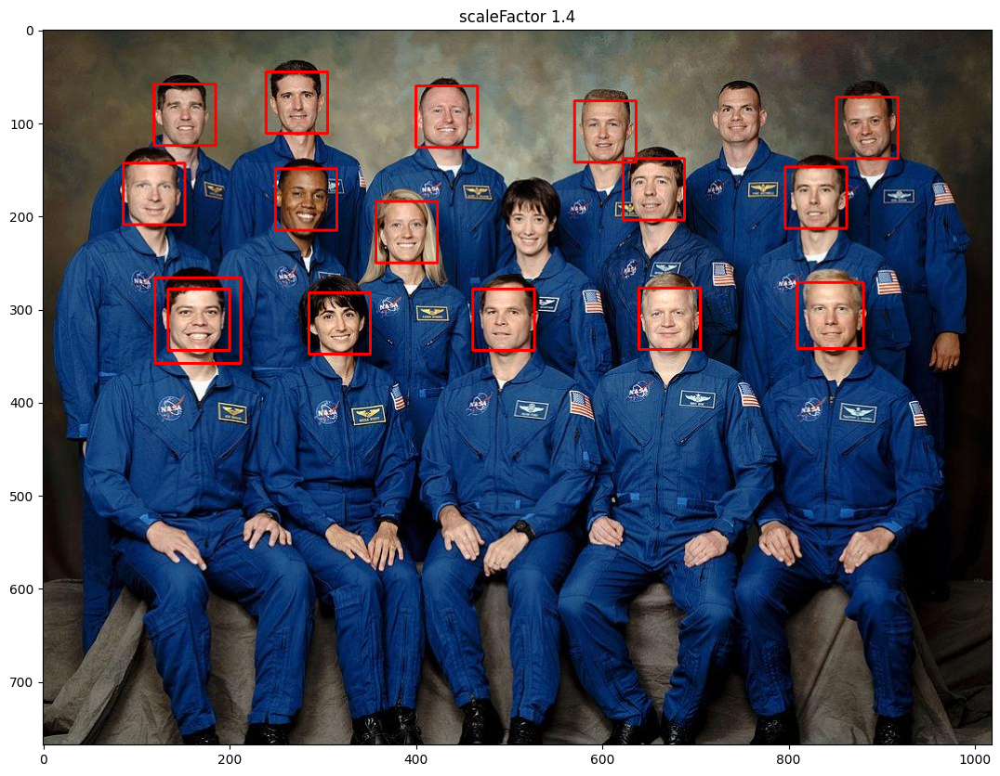

minNeighbors 1: Number of detected faces: 31


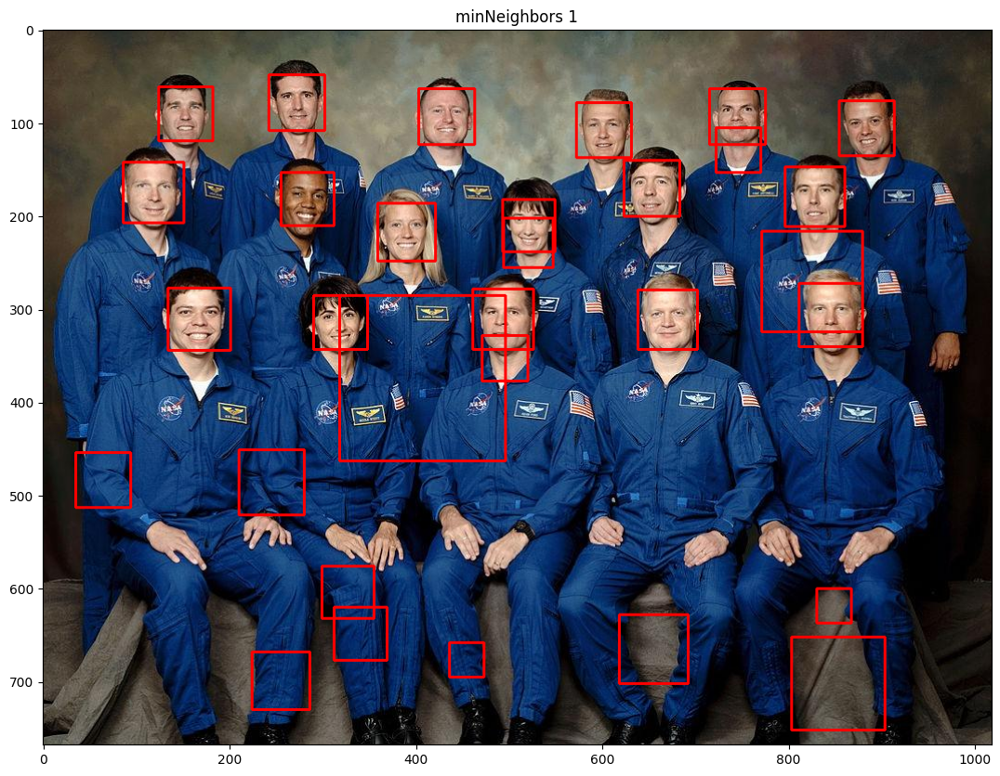

minNeighbors 10: Number of detected faces: 18


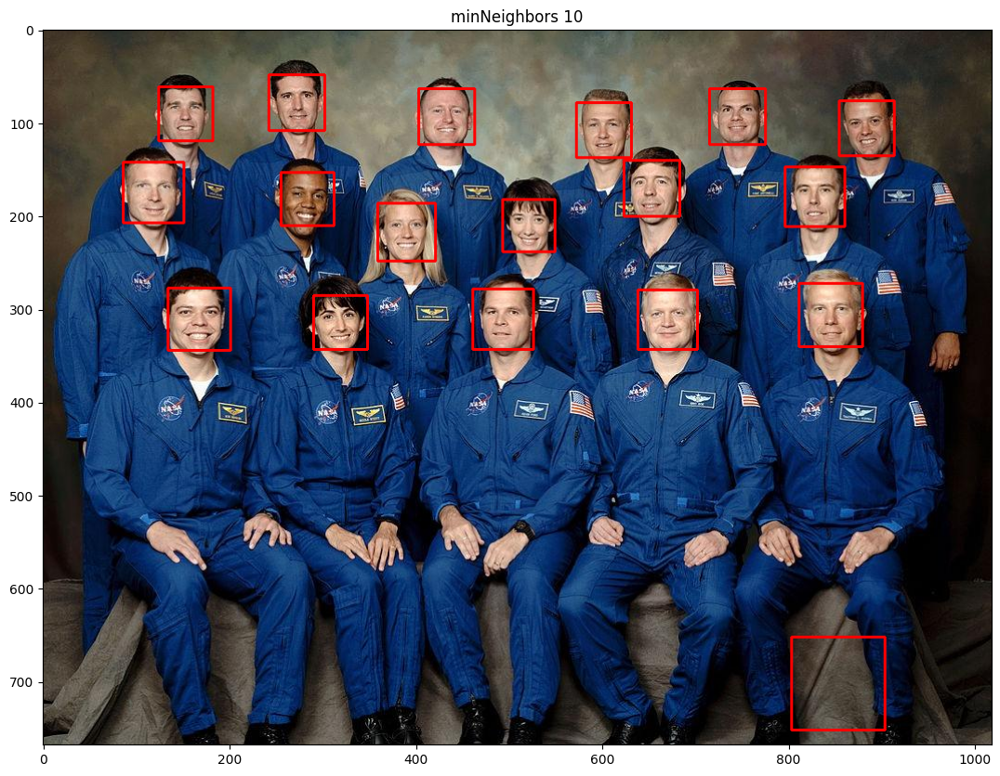

minSize 100x100: Number of detected faces: 2


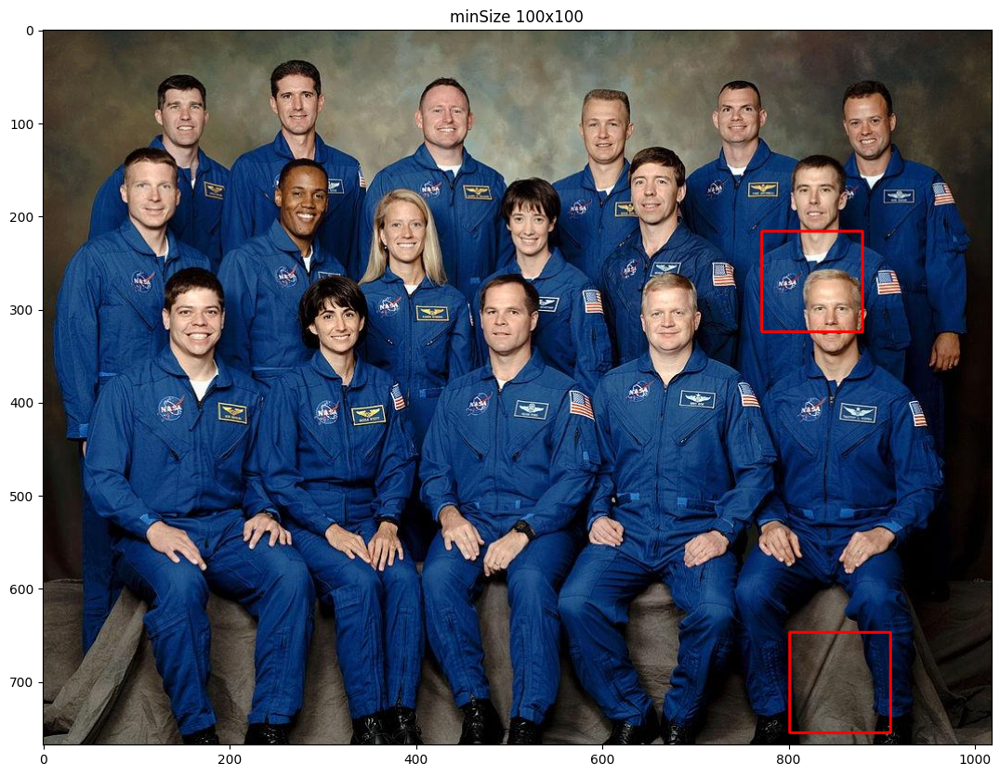

In [42]:
img = cv2.imread('NASA_Astronaut_Group_18.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

parameter_sets = [
    {'title':'original', 'scaleFactor': 1.1, 'minNeighbors': 5, 'minSize': (30, 30)},
    {'title':'scaleFactor 1.05', 'scaleFactor': 1.05, 'minNeighbors': 5, 'minSize': (30, 30)},
    {'title':'scaleFactor 1.3', 'scaleFactor': 1.3, 'minNeighbors': 5, 'minSize': (30, 30)},
    {'title':'scaleFactor 1.4', 'scaleFactor': 1.4, 'minNeighbors': 5, 'minSize': (30, 30)},
    {'title':'minNeighbors 1', 'scaleFactor': 1.1, 'minNeighbors': 1, 'minSize': (30, 30)},
    {'title':'minNeighbors 10', 'scaleFactor': 1.1, 'minNeighbors': 10, 'minSize': (30, 30)},
    {'title':'minSize 100x100', 'scaleFactor': 1.1, 'minNeighbors': 3, 'minSize': (100, 100)},
]
for parameter_set in parameter_sets:
    faces = face_cascade.detectMultiScale(
        img_gray,
        scaleFactor=parameter_set['scaleFactor'],
        minNeighbors=parameter_set['minNeighbors'],
        minSize=parameter_set['minSize']
    )
    print(f"{parameter_set['title']}: Number of detected faces: {faces.shape[0]}")
    # Copy the original image to draw the boxes on
    img_with_boxes = img.copy()

    # Enumerate faces to label them
    for face in faces:
        x1, y1, x2, y2 = face[0], face[1], face[0] + face[2], face[1] + face[3]
        cv2.rectangle(img_with_boxes, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Red box with thickness 2
    plt.figure(figsize=(20,10))
    plt.title(parameter_set['title'])
    plt.imshow(img_with_boxes)
    plt.show()

### 7.4 Document your findings

To formalize your experimental results, fill out the following table. This practice transforms simple code execution into a structured analysis, encouraging you to connect parameter changes to specific outcomes and articulate your understanding.

My understanding how this algorithm works:
- A sliding window parses the image.
- Within the window, Haar features are being detected.
- if the combination of detected features match what it has learned about a face, there is a match.
- The parsing happens multiple times, with increasing window sizes (increase by scaleFactor, starting with minSize), until the window size reaches the size of the image.
- A face is only recognised when the face more or less fills the window. 
- As a consequence: A higher scaleFactor means opportunities for face windows are less.
- A higher minSize means smaller faces can't be detected. 
- Neighbouring windows on the the same scale may cover the same face. 
- minNeighbour excludes all matches where there are less neighbouring windows that detect a face. So the higher minNeighbor, the more likely it is that there is a face


Parameter Changed  | Value(s) Tested | # Detections | # Missed Detections | Observations & Analysis
-----------|-----------|-------|----------|---------
scaleFactor      | 1.05 vs. 1.4 | 24 vs 16  | 0 vs 1  | Scaling with 1.4 reduces the number of findings. 1.4 may be a bit too high: One face seems to be falling through the wider gaps. 
minNeighbors     | 1 vs. 5 vs. 10 | 31 vs 24 vs 18  | 0  | The higher minNeighbour number increases the precision. 
minSize.         | (30, 30) vs. (100, 100). | 24 vs 12 | all | The faces are clearly significantly smaller than 100x100, hence they are not recognised.  